In [1]:
import time
from oads_access.oads_access import OADS_Access, add_label_box_to_axis, add_label_boxes_to_axis
from result_manager.result_manager import ResultManager
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image
from pytorch_utils.pytorch_utils import ToJpeg, ToOpponentChannel


In [2]:
%matplotlib widget
basedir = '/home/niklas/projects/data/oads'

oads = OADS_Access(basedir=basedir, file_formats='.ARW', n_processes=16)
result_manager = ResultManager(root='/home/niklas/projects/oads_access/analysis/results')
figs = []

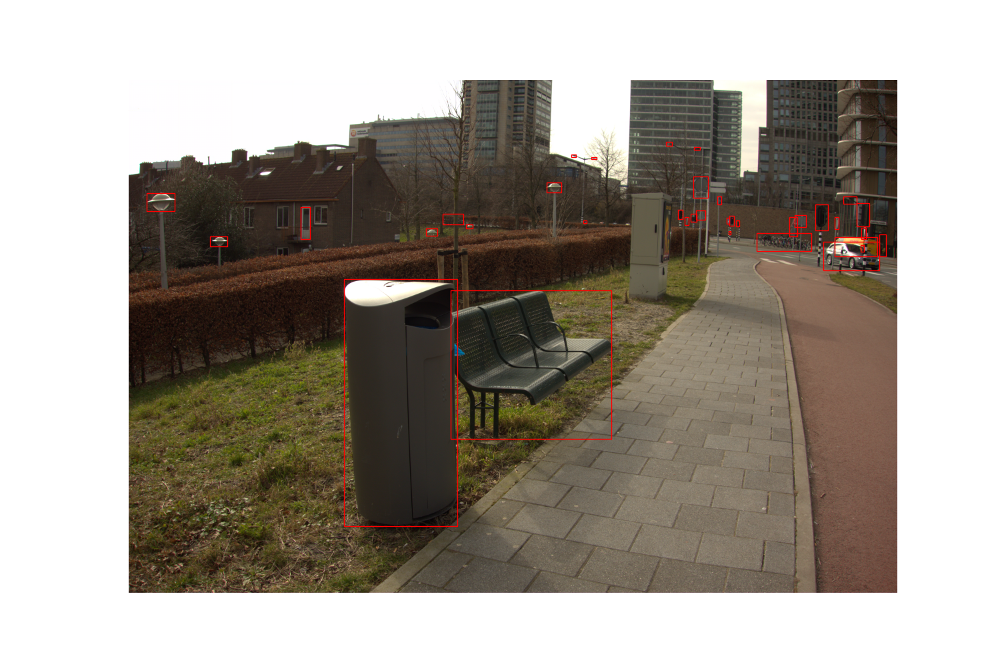

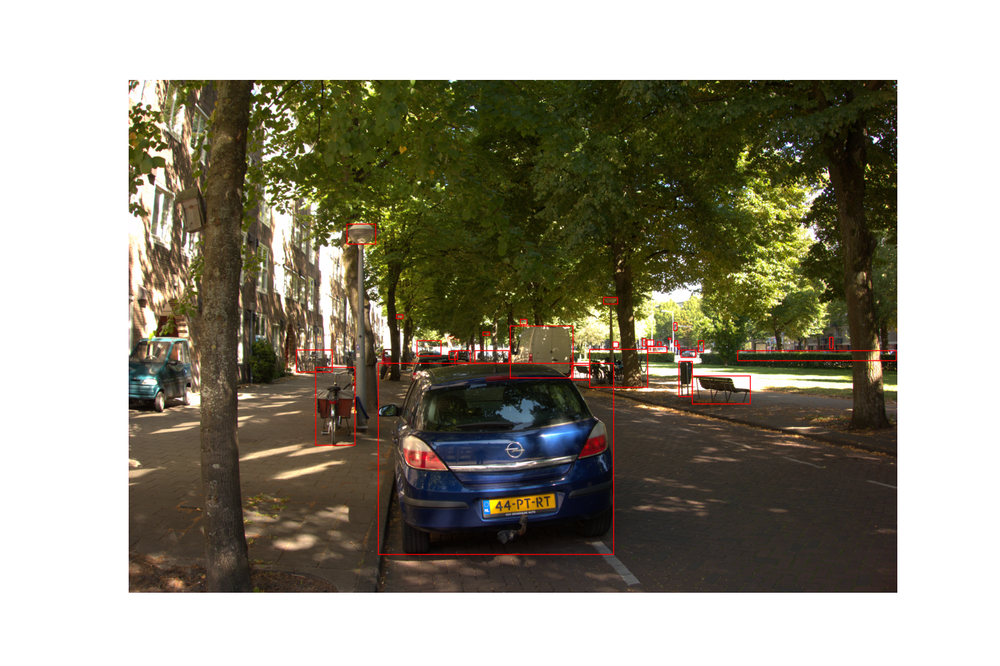

In [11]:
img1, obj1 = oads.load_image('0a18e64e9c9c1cdc')
img2, obj2 = oads.load_image('000a464c4c86d4cc')

fig1, ax1 = plt.subplots(1,1, figsize=(15,10))
fig2, ax2 = plt.subplots(1,1, figsize=(15,10))

ax1.imshow(img1)
ax2.imshow(img2)

ax1.axis('off')
ax2.axis('off')

add_label_boxes_to_axis(label=obj1, ax=ax1, add_title=False)
add_label_boxes_to_axis(label=obj2, ax=ax2, add_title=False)

figs.append(fig1)
figs.append(fig2)

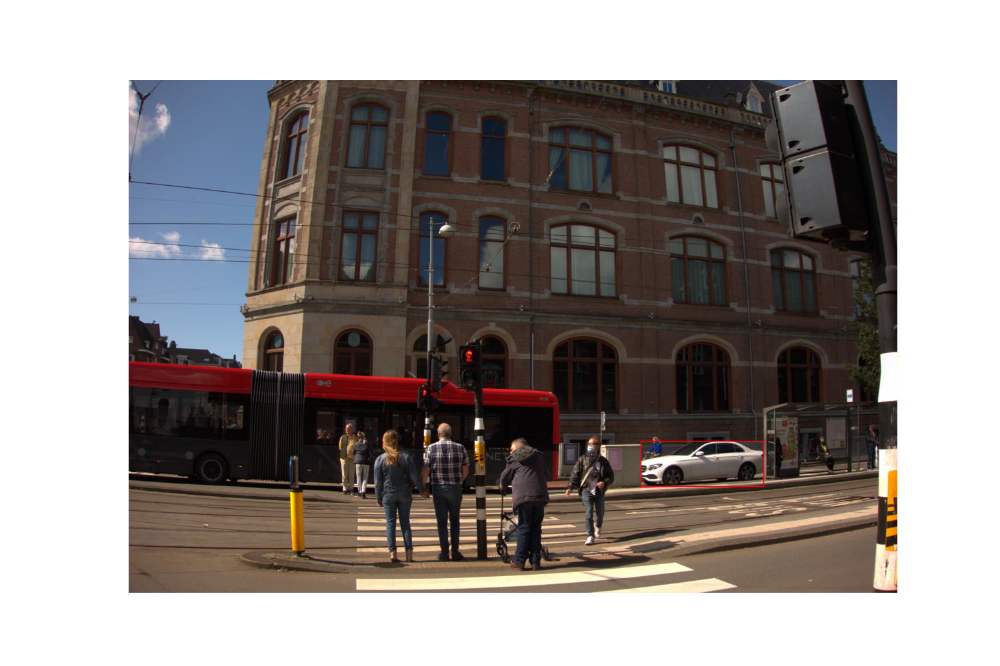

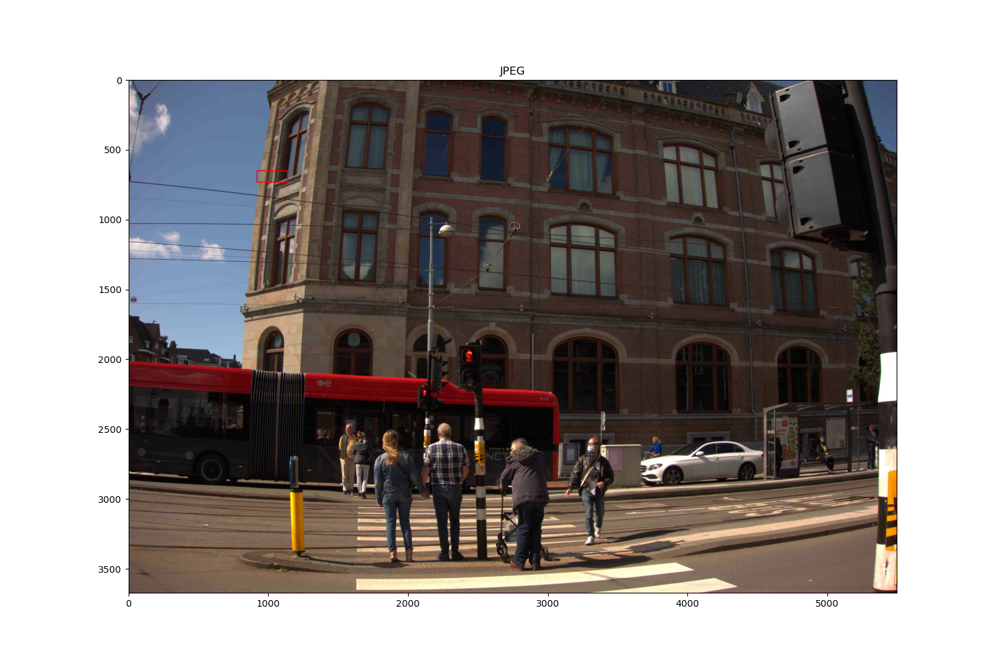

In [3]:

# print(oads.image_names['92823b8c86c343c3'])
img, obj = oads.load_image('0a0e1801856d4ded')
JPEG = ToJpeg(quality=25, resize=False, resize_factor=4)


fig, (ax) = plt.subplots(1, 1, figsize=(15,10))
ax.imshow(img)
ax.axis('off')
add_label_box_to_axis(obj=obj['objects'][3], ax=ax, is_raw=True)
figs.append(fig)

fig, (ax0) = plt.subplots(1, 1, figsize=(15,10))
ax0.imshow(JPEG(img))
# ax0.axis('off')
ax0.set_title('JPEG')
add_label_box_to_axis(obj=obj['objects'][3], ax=ax0, is_raw=False)

figs.append(fig)



In [ ]:
# crop_box = (0,0,100,100)
crop_box = np.array(obj['objects'][3]['points']['exterior']).flatten()
raw_crop_box = crop_box * 4

# print(crop_box)

figsize = (15,10)

fig, (ax, ax0) = plt.subplots(1,2, figsize=figsize)
_x = Image.fromarray(img).crop(raw_crop_box)
ax.imshow(_x)
ax.set_xlabel(np.array(_x).shape)
# ax.axis('off')
# ax.set_title('Crop')
figs.append(fig)

# fig, ax = plt.subplots(, fisize=figsize)
_x = JPEG(Image.fromarray(img).crop(raw_crop_box))
ax0.imshow(_x)
ax0.set_xlabel(np.array(_x).shape)
# ax0.axis('off')
ax0.set_title("JPEG")
# figs.append(fig)

# _x = Image.fromarray(JPEG(img)).crop(crop_box)
# ax1.imshow(_x)
# ax1.set_xlabel(np.array(_x).shape)
# # ax1.axis('off')
# ax1.set_title("JPEG -> Crop")


In [ ]:
figsize = (15,10)

fig, (ax, ax0) = plt.subplots(2,3, figsize=figsize)
_x = Image.fromarray(img).crop(raw_crop_box)
ax[0].imshow(np.array(_x)[:,:,0], cmap='Reds')
ax[0].set_xlabel(np.array(_x).shape)
# ax.axis('off')
# ax.set_title('Crop')
ax[1].imshow(np.array(_x)[:,:,1], cmap='Greens')
ax[1].set_xlabel(np.array(_x).shape)
# ax.axis('off')
# ax.set_title('Crop')
ax[2].imshow(np.array(_x)[:,:,2], cmap='Blues')
ax[2].set_xlabel(np.array(_x).shape)
# ax.axis('off')
# ax.set_title('Crop')

# fig, ax = plt.subplots(, fisize=figsize)
_x_jpeg = JPEG(Image.fromarray(img).crop(raw_crop_box))
ax0[0].imshow(_x_jpeg[:,:,0], cmap='Reds')
ax0[0].set_xlabel(np.array(_x_jpeg).shape)
# ax0[0].axis('off')
ax0[0].set_title("JPEG R")
ax0[1].imshow(_x_jpeg[:,:,1], cmap='Greens')
ax0[1].set_xlabel(np.array(_x_jpeg).shape)
# ax0[0].axis('off')
ax0[1].set_title("JPEG G")

ax0[2].imshow(_x_jpeg[:,:,2], cmap='Blues')
ax0[2].set_xlabel(np.array(_x_jpeg).shape)
# ax0[0].axis('off')
ax0[2].set_title("JPEG B")


figs.append(fig)

In [ ]:
fig, (ax, ax0) = plt.subplots(2,3, figsize=figsize)
coc = ToOpponentChannel()(Image.fromarray(img).crop(raw_crop_box))

from  matplotlib.colors import LinearSegmentedColormap
cmap_rg =LinearSegmentedColormap.from_list('rg',["r", "w", "g"], N=256)
cmap_by =LinearSegmentedColormap.from_list('rg',["b", "w", "y"], N=256)

fig.suptitle('Crop First')
########

_x = coc[:,:,0]
ax[0].imshow(_x, cmap='gray')
ax[0].set_xlabel(np.array(_x).shape)

# ax[0].axis('off')
ax[0].set_title("Intensity")


_x = ToOpponentChannel()(Image.fromarray(JPEG(img)).crop(crop_box))[:,:,0]
ax0[0].imshow(_x, cmap='gray')
ax0[0].set_xlabel(np.array(_x).shape)

# ax0[0].axis('off')
ax0[0].set_title("JPEG")

#########
_x = coc[:,:,1]
ax[1].imshow(_x, cmap=cmap_rg)
ax[1].set_xlabel(np.array(_x).shape)

# ax[1].axis('off')
ax[1].set_title("RG")


_x = ToOpponentChannel()(Image.fromarray(JPEG(img)).crop(crop_box))[:,:,1]
ax0[1].imshow(_x, cmap=cmap_rg)
ax0[1].set_xlabel(np.array(_x).shape)

# ax[2].axis('off')
ax0[1].set_title("JPEG")

# ########
_x = coc[:,:,2]
ax[2].imshow(_x, cmap=cmap_by)
ax[2].set_xlabel(np.array(_x).shape)

# ax1[0].axis('off')
ax[2].set_title("BY")


_x = ToOpponentChannel()(Image.fromarray(JPEG(img)).crop(crop_box))[:,:,2]
ax0[2].imshow(_x, cmap=cmap_by)
ax0[2].set_xlabel(np.array(_x).shape)

# ax1[1].axis('off')
ax0[2].set_title("JPEG")
########

figs.append(fig)

In [ ]:
fig, (ax, ax0) = plt.subplots(2,3, figsize=figsize)

fig.suptitle('COC First')
coc = ToOpponentChannel()(img)
########
_x = np.array(Image.fromarray(coc[:,:,0]).crop(raw_crop_box))
ax[0].imshow(_x, cmap="gray")
ax[0].set_xlabel(np.array(_x).shape)

# ax[0].axis('off')
ax[0].set_title("Intensity")

_x = JPEG(Image.fromarray(coc[:,:,0]).crop(raw_crop_box))
ax0[0].imshow(_x, cmap="gray")
ax0[0].set_xlabel(np.array(_x).shape)

# ax[1].axis('off')
ax0[0].set_title("JPEG")


########
_x = np.array(Image.fromarray(coc[:,:,1]).crop(raw_crop_box))
ax[1].imshow(_x, cmap=cmap_rg)
ax[1].set_xlabel(np.array(_x).shape)
ax[1].set_title("RG")
# ax0[0].axis('off')

_x = JPEG(Image.fromarray(coc[:,:,1]).crop(raw_crop_box))
ax0[1].imshow(_x, cmap=cmap_rg)
ax0[1].set_xlabel(np.array(_x).shape)
ax0[1].set_title("JPEG")
# ax0[1].axis('off')
# ax0[1].set_title("COC -> Crop")


########
_x = np.array(Image.fromarray(coc[:,:,2]).crop(raw_crop_box))
ax[2].imshow(_x, cmap=cmap_by)
ax[2].set_xlabel(np.array(_x).shape)
ax[2].set_title("BY")
# ax1[0].axis('off')

_x = JPEG(Image.fromarray(coc[:,:,2]).crop(raw_crop_box))
ax0[2].imshow(_x, cmap=cmap_by)
ax0[2].set_xlabel(np.array(_x).shape)

# ax1[1].axis('off')
ax0[2].set_title("JPEG")


########


figs.append(fig)

In [ ]:
result_manager.save_pdf(figs=figs, filename='jpeg_demo.pdf')